# Configuration

In [ ]:
# pip install umap

In [ ]:
# pip install --upgrade numpy==1.24.3 tensorflow==2.12.0 jax==0.4.13 umap-learn==0.5.4

In [ ]:
# !pip show numpy scikit-learn imblearn

In [ ]:
# pip install --upgrade scikit-learn==1.2.2 imbalanced-learn==0.10.1

In [ ]:
# !pip install numpy==1.23.5 scikit-learn==1.1.3 imbalanced-learn==0.9.1 --upgrade --force-reinstall


In [ ]:
from umap.umap_ import UMAP

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from imblearn.over_sampling import RandomOverSampler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, balanced_accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, average_precision_score
from sklearn.model_selection import GridSearchCV
# from umap import UMAP
from umap.umap_ import UMAP
from sklearn.ensemble import VotingClassifier

import pickle as pkl
pd.set_option('display.max_columns', None)

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/NCKH 2024/data - NCKH-NEU/preprocessed_data.csv')
#df = pd.read_csv('/content/drive/MyDrive/NEU/NCKH 2024/data - NCKH-NEU/preprocessed_data.csv')

# Functions

In [ ]:
def handle_outliers_iqr(X_train: pd.DataFrame, X_test: pd.DataFrame):
    # Select only numeric columns
    numeric_cols = X_train.select_dtypes(include="number").columns
    cols = ['Occupation', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Auto Loan',
           'Credit-Builder Loan','Debt Consolidation Loan', 'Home Equity Loan',
           'Mortgage Loan', 'No Loan','Not Specified', 'Payday Loan', 'Personal Loan', 'Student Loan']
    keep = {'Delay_from_due_date', 'Changed_Credit_Limit'}
    for col in cols:
      if col in numeric_cols:
        numeric_cols = numeric_cols.drop([col])

    bounds = {}
    for col in numeric_cols:
        # Calculate Q1, Q3, and IQR for X_train
        Q1 = X_train[col].quantile(0.25)
        Q3 = X_train[col].quantile(0.75)
        IQR = Q3 - Q1

        if col in keep:
            lower_bound = Q1 - 1.5 * IQR
        else:
            lower_bound = max(0, Q1 - 1.5 * IQR)

        upper_bound = Q3 + 1.5 * IQR
        bounds[col] = (lower_bound, upper_bound)

        # Print the bounds
        print(f"Column: {col}")
        print(f"  Lower Bound: {lower_bound}")
        print(f"  Upper Bound: {upper_bound}")

    X_train_clipped = X_train.copy()
    X_test_clipped = X_test.copy()

    for col, (lower_bound, upper_bound) in bounds.items():
        X_train_clipped[col] = np.clip(X_train[col], lower_bound, upper_bound)
        X_test_clipped[col] = np.clip(X_test[col], lower_bound, upper_bound)
    return X_train_clipped, X_test_clipped

In [ ]:
def visualize_imbalance(data, target_column, after=False):
    class_counts = data[target_column].value_counts()
    #class_labels = {0: 'Good', 1: 'Poor'}
    class_labels = {0: 'Standard', 1:'Non-standard'}

    # Set colors: 'Good' = green, 'Poor' = red
    colors = ['green' if label == 'Non-standard' else 'red' for label in class_labels.values()]

    # Create the plot
    plt.figure(figsize=(8, 5))
    sns.barplot(x=class_counts.index.map(class_labels), y=class_counts.values, palette=colors)

    # Title based on after parameter
    if after:
        plt.title("Class Distribution After ROS", fontsize=16)
    else:
        plt.title("Class Distribution Before ROS", fontsize=16)

    plt.xlabel("Credit Score", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(ticks=range(len(class_counts)), labels=class_counts.index.map(class_labels), fontsize=10)
    plt.grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.show()

In [ ]:
def split_data(data, test_size=0.2):
  df_copy = data.copy()
  X = df_copy.drop("Credit_Score", axis=1)
  y = df_copy["Credit_Score"]

  # Split Customer_IDs into training and validation sets
  unique_customers = X['Customer_ID'].unique()
  train_customers, test_customers = train_test_split(
      unique_customers,
      test_size=test_size,
      random_state=2,
      shuffle=True
  )

  # Filter data based on the split Customer_IDs
  Xtrain = X[X['Customer_ID'].isin(train_customers)].drop('Customer_ID', axis=1)
  Xtest = X[X['Customer_ID'].isin(test_customers)].drop('Customer_ID', axis=1)
  ytrain = y[X['Customer_ID'].isin(train_customers)]
  ytest = y[X['Customer_ID'].isin(test_customers)]

  # Apply RandomOverSampler to the training set only
  ros = RandomOverSampler(sampling_strategy='auto', random_state=42)
  Xtrain_resampled, ytrain_resampled = ros.fit_resample(Xtrain, ytrain)

  visualize_imbalance(pd.DataFrame(ytrain), 'Credit_Score', False)
  visualize_imbalance(pd.DataFrame(ytrain_resampled), 'Credit_Score', True)
  return (Xtrain_resampled, Xtest, ytrain_resampled, ytest)

In [ ]:
def sensitivity_specificity(y_true, y_pred, name):
    cm = confusion_matrix(y_true, y_pred)

    TN, FP, FN, TP = cm.ravel()
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Print values
    print(f"Sensitivity (Recall): {sensitivity:.4f}")
    print(f"Specificity: {specificity:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Pred 0", "Pred 1"], yticklabels=["True 0", "True 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix of {name}")
    plt.show()

    return sensitivity, specificity

In [ ]:
def plot_feature_importance(model, feature_names, title="Feature Importance", figsize=(10, 6)):
    feature_importances = model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=True)

    plt.figure(figsize=figsize)
    plt.barh(importance_df['Feature'], importance_df['Importance'])
    plt.xlabel('Feature Importance')
    plt.title(title)
    plt.show()

In [ ]:
def plot_embeddings(embedding, method_name, errors, model_name):
    classes = np.unique(ytest)

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns
    for ax, label in zip(axes, classes):
        # Correct predictions for the current class
        idx_correct = (ytest == label) & ~errors
        ax.scatter(embedding[idx_correct, 0], embedding[idx_correct, 1],
                   label=f'Class {label} (Correct)', alpha=0.7, marker='o', color='green')

        # Misclassified predictions for the current class
        idx_error = (ytest == label) & errors
        misclassified_count = np.sum(idx_error)
        ax.scatter(embedding[idx_error, 0], embedding[idx_error, 1],
                   label=f'Class {label} (Error - {misclassified_count} misclassified)', alpha=0.7, marker='x', color='red')

        ax.set_title(f'Class {label} - {method_name}')
        ax.legend()
        ax.set_xlabel('Component 1')
        ax.set_ylabel('Component 2')

    fig.suptitle(f"{method_name} Visualization of Classification Errors for {model_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [ ]:
def plot_uncertain_predictions(models, y_probs, threshold=(0.45, 0.55)):
    num_uncertain = []
    for y_prob in y_probs:
        uncertain = (y_prob >= threshold[0]) & (y_prob <= threshold[1])
        num_uncertain.append(np.sum(uncertain))

    # Bar chart for uncertain predictions
    plt.figure(figsize=(10, 6))
    plt.bar(models, num_uncertain, color='skyblue')
    plt.title("Number of Uncertain Predictions by Model")
    plt.xlabel("Models")
    plt.ylabel("Number of Uncertain Predictions")
    plt.xticks(rotation=45)
    plt.grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.show()

In [ ]:
def plot_misclassified_uncertain_by_class(models, y_probs, y_preds, threshold=(0.45, 0.55)):
    misclassified_counts = []

    for y_prob, y_pred in zip(y_probs, y_preds):
        uncertain = (y_prob >= threshold[0]) & (y_prob <= threshold[1])
        misclassified = uncertain & (ytest != y_pred)
        misclassified_by_class = pd.Series(ytest[misclassified]).value_counts()
        misclassified_counts.append(misclassified_by_class)

    # Combine counts into a DataFrame for stacked bar chart
    misclassified_df = pd.DataFrame(misclassified_counts, index=models).fillna(0).astype(int)

    # Define custom colors for classes
    class_colors = {0: 'green', 1: 'red'}
    colors = [class_colors[col] for col in misclassified_df.columns]

    # Stacked bar chart
    misclassified_df.plot(kind="bar", stacked=True, figsize=(10, 6), color=colors)
    plt.title("Misclassified Uncertain Predictions by Class")
    plt.xlabel("Models")
    plt.ylabel("Number of Misclassified Predictions")
    plt.xticks(rotation=45)
    plt.grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.legend(title="Class")
    plt.show()

# Modeling

#### 1. Split data
The data is split on **'Customer_ID'** to avoid over fitting, with the 80% into training and 20% into testing.

**Random Over Sampling** and **Interquantile Range (IQR)** are then applied to tackle imbalance and remove any outliers that might affect the classifaction proccess

<ipython-input-28-311e3895f134>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index.map(class_labels), y=class_counts.values, palette=colors)


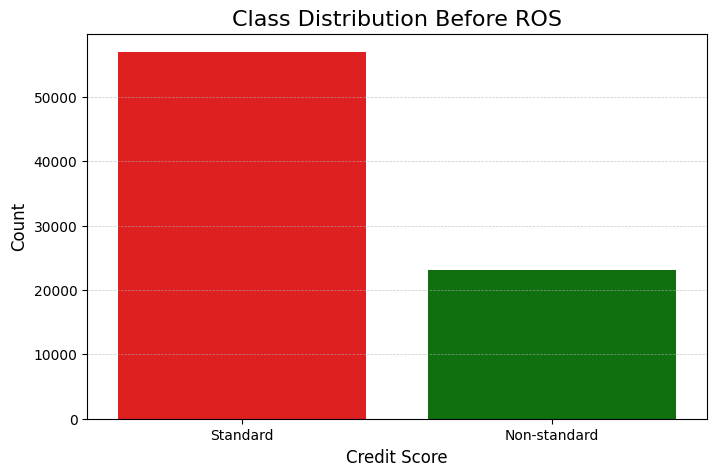

<ipython-input-28-311e3895f134>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index.map(class_labels), y=class_counts.values, palette=colors)


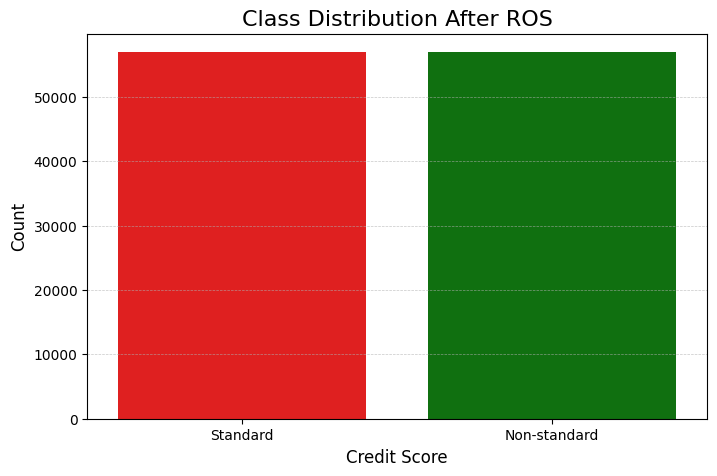

In [ ]:
train = split_data(df)
Xtrain, Xtest, ytrain, ytest = train

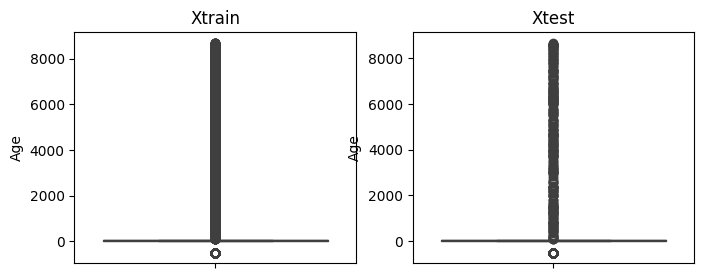

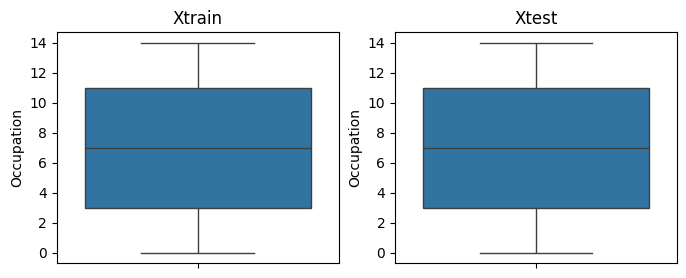

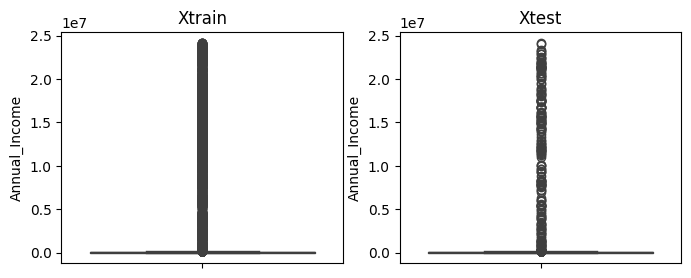

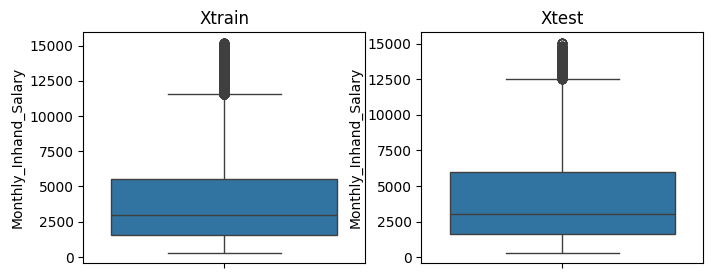

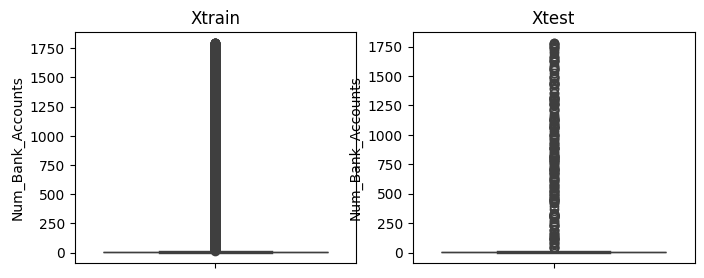

...

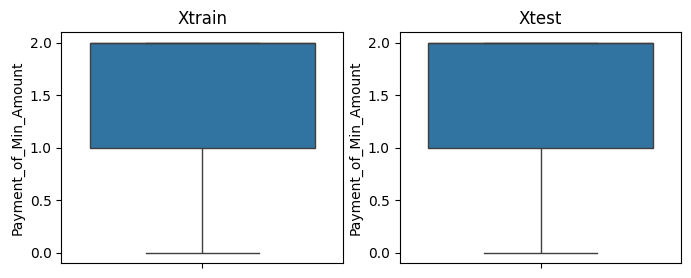

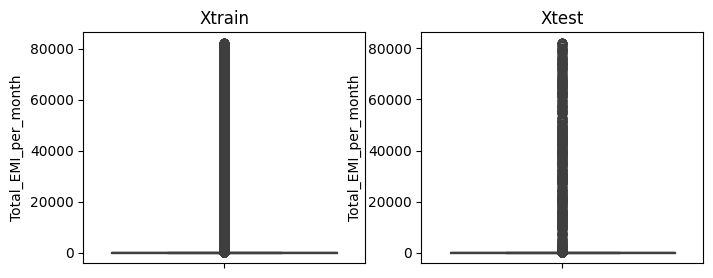

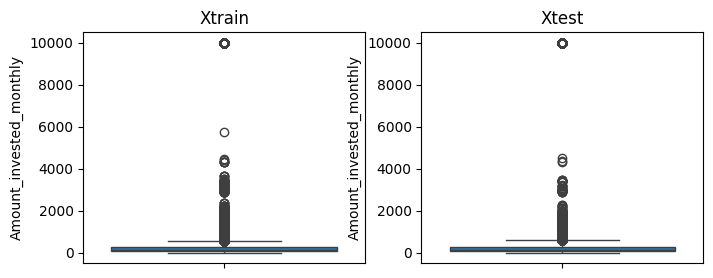

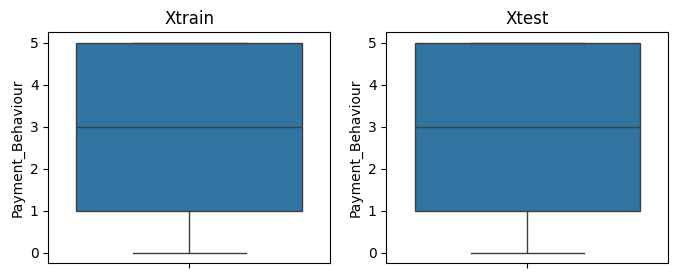

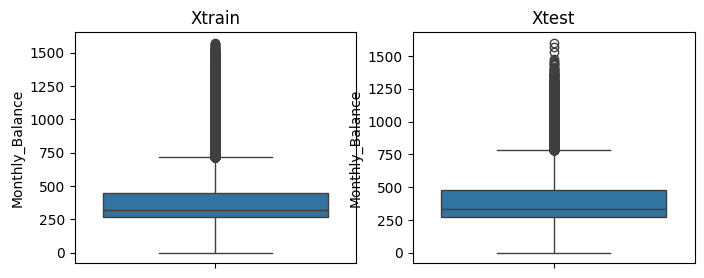

In [ ]:
num_cols = Xtrain.select_dtypes(include='number').columns
for col in num_cols:
  plt.figure(figsize=(8,3))
  plt.subplot(1,2,1)
  sns.boxplot(Xtrain[col])
  plt.title('Xtrain')
  plt.subplot(1,2,2)
  sns.boxplot(Xtest[col])
  plt.title('Xtest')
  plt.show()

In [ ]:
Xtrain, Xtest = handle_outliers_iqr(Xtrain, Xtest)

Column: Age
  Lower Bound: 0
  Upper Bound: 66.5
Column: Annual_Income
  Lower Bound: 0
  Upper Bound: 142613.52749999997
Column: Monthly_Inhand_Salary
  Lower Bound: 0
  Upper Bound: 11538.059583333335
Column: Num_Bank_Accounts
  Lower Bound: 0
  Upper Bound: 14.0
Column: Num_Credit_Card
  Lower Bound: 0
  Upper Bound: 11.5
Column: Interest_Rate
  Lower Bound: 0
  Upper Bound: 48.0
Column: Num_of_Loan
  Lower Bound: 0
  Upper Bound: 12.0
Column: Delay_from_due_date
  Lower Bound: -19.0
  Upper Bound: 61.0
Column: Num_of_Delayed_Payment
  Lower Bound: 0
  Upper Bound: 32.5
Column: Changed_Credit_Limit
  Lower Bound: -9.254999999999999
  Upper Bound: 30.144999999999996
Column: Num_Credit_Inquiries
  Lower Bound: 0
  Upper Bound: 20.5
Column: Outstanding_Debt
  Lower Bound: 0
  Upper Bound: 4713.475
Column: Credit_Utilization_Ratio
  Lower Bound: 15.277555961144316
  Upper Bound: 49.09361534415851
Column: Credit_History_Age
  Lower Bound: 0
  Upper Bound: 42.45833333333332
Column: Total_

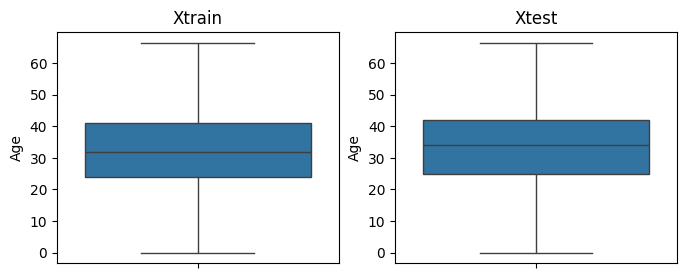

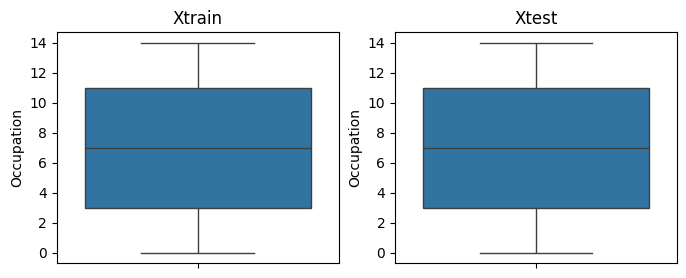

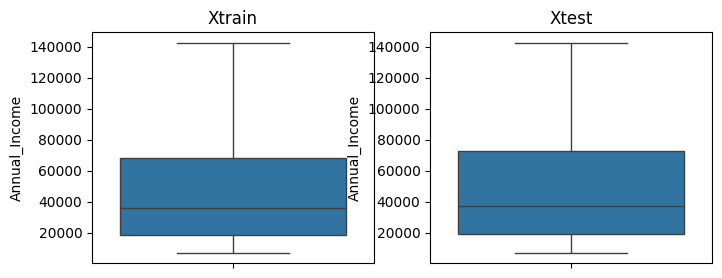

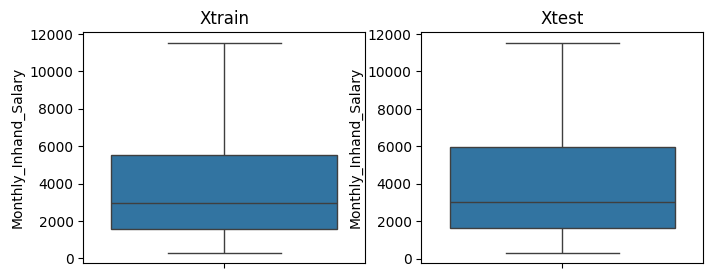

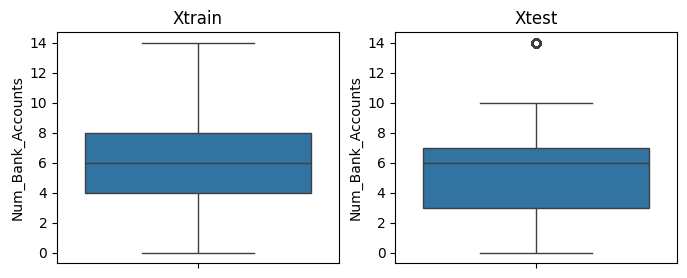

...

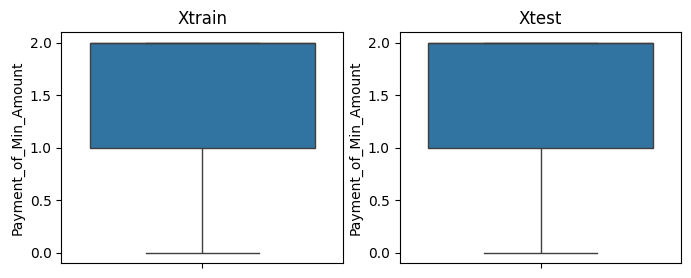

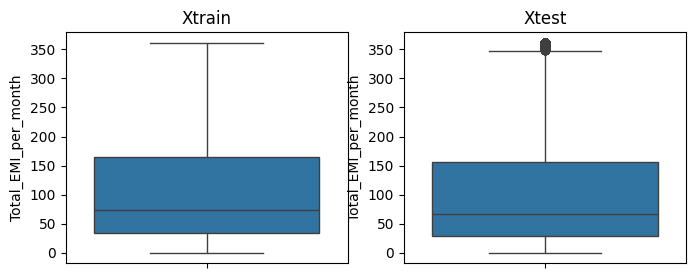

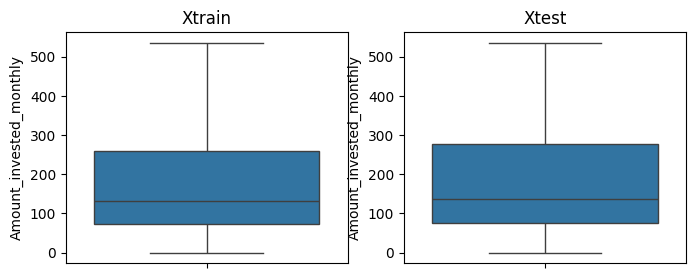

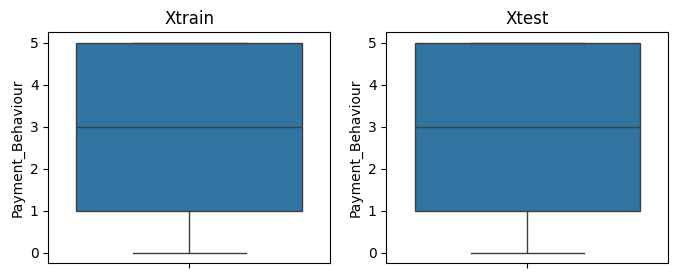

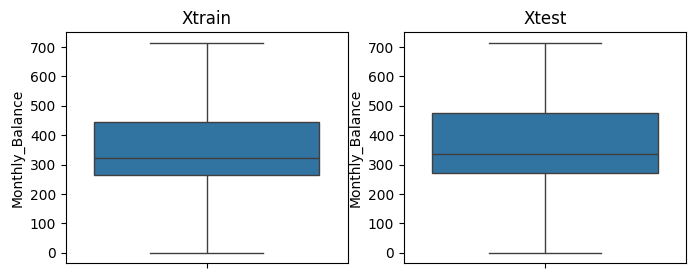

In [ ]:
num_cols = Xtrain.select_dtypes(include='number').columns
for col in num_cols:
  plt.figure(figsize=(8,3))
  plt.subplot(1,2,1)
  sns.boxplot(Xtrain[col])
  plt.title('Xtrain')
  plt.subplot(1,2,2)
  sns.boxplot(Xtest[col])
  plt.title('Xtest')
  plt.show()

In [ ]:
scaler = MinMaxScaler()
scaler.fit(Xtrain)
Xtrain = pd.DataFrame(scaler.transform(Xtrain), columns=Xtrain.columns)
Xtest = pd.DataFrame(scaler.transform(Xtest), columns=Xtest.columns)

In [ ]:
sample_indices = Xtrain.sample(n=1000, random_state=42).index
Xtrain_sampled = Xtrain.loc[sample_indices]
ytrain_sampled = ytrain.loc[sample_indices]

# Apply UMAP for 2D projection on the sampled data
umap_model = UMAP(n_components=2, random_state=42)
embedding = umap_model.fit_transform(Xtrain_sampled)

# Create a DataFrame for visualization
umap_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
umap_df['Credit_Score'] = ytrain_sampled.values


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


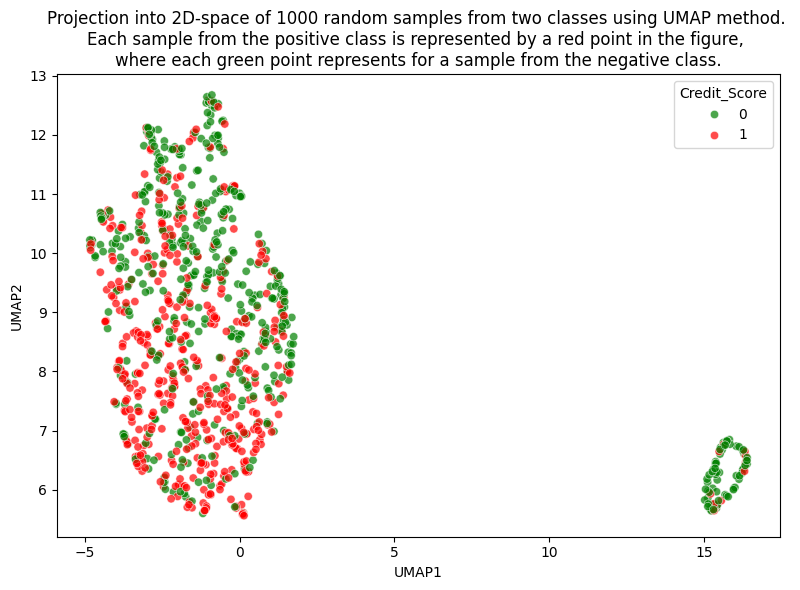

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Credit_Score', palette={0: 'green', 1: 'red'}, alpha=0.7, ax=ax)

ax.set_title('Projection into 2D-space of 1000 random samples from two classes using UMAP method. \nEach sample from the positive class is represented by a red point in the figure, \nwhere each green point represents for a sample from the negative class.')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')

plt.tight_layout()
plt.show()


#### 2. Training models

The models we used are **Logistic Regression, Random Forest, Decision Tree, XG Boost and Gaussian Naive Bayes classifier** to find the top best models. To maximimize their performance, **RandomSearchCV** is used to find the suitable parameters. This process is conducted locally since it takes too long for it to find.

In [ ]:
lr_model = LogisticRegression(
    solver='saga',
    penalty='l1',
    C=206.913808111479
)
lr_model.fit(Xtrain, ytrain)

LogisticRegression(C=206.913808111479, penalty='l1', solver='saga')

In [ ]:
rf_model = RandomForestClassifier(
    n_estimators=250,
    min_samples_split=2,
    min_samples_leaf=1,
    max_depth=20,
    bootstrap=True
)
rf_model.fit(Xtrain, ytrain)

RandomForestClassifier(max_depth=20, n_estimators=250)

In [ ]:
dt_model = DecisionTreeClassifier(
    max_depth=19,
    min_samples_split=2,
    min_samples_leaf=1
)
dt_model.fit(Xtrain, ytrain)

DecisionTreeClassifier(max_depth=19)

In [ ]:
pip install xgboost==1.7.5

In [ ]:
xgb_model = XGBClassifier(
    subsample=0.6,
    scale_pos_weight=1,
    n_estimators=150,
    max_depth=5,
    learning_rate=0.1,
    gamma=0,
    colsample_bytree = 0.8
)
xgb_model.fit(Xtrain, ytrain)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=150, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
nb_model = GaussianNB(var_smoothing=0.00011288378916846884)
nb_model.fit(Xtrain, ytrain)

GaussianNB(var_smoothing=0.00011288378916846884)

#### 3. Model Analysis


a. Model Performance

To evaluate the performance of each model, we focus on metrics like **recall and balanced accuracy** rather than just accuracy, since the dataset is imbalanced.

Additionally, we provide **feature importance** to highlight which features have the greatest impact on each model's predictions.

* Logistic Regression

Sensitivity (Recall): 0.7051
Specificity: 0.7853


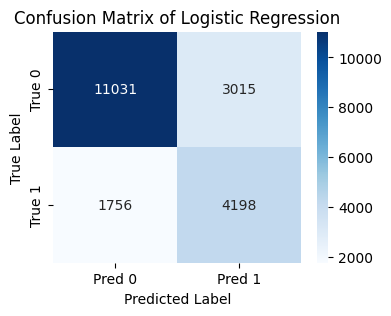

              precision    recall  f1-score   support

           0       0.86      0.79      0.82     14046
           1       0.58      0.71      0.64      5954

    accuracy                           0.76     20000
   macro avg       0.72      0.75      0.73     20000
weighted avg       0.78      0.76      0.77     20000

Balanced Accuracy: 0.7452101810878992


In [ ]:
y_pred_lr = lr_model.predict(Xtest)
sensitivity_specificity(ytest, y_pred_lr, 'Logistic Regression')
print(classification_report(ytest, y_pred_lr))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_lr)}')

Sensitivity (Recall): 0.7222
Specificity: 0.7910


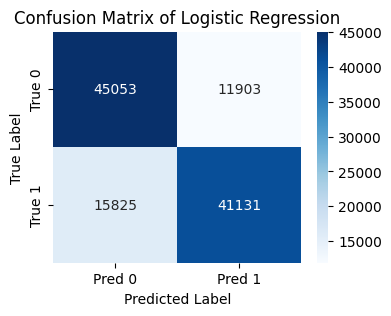

              precision    recall  f1-score   support

           0       0.74      0.79      0.76     56956
           1       0.78      0.72      0.75     56956

    accuracy                           0.76    113912
   macro avg       0.76      0.76      0.76    113912
weighted avg       0.76      0.76      0.76    113912

Balanced Accuracy: 0.756584029777372


In [ ]:
y_train_pred_lr = lr_model.predict(Xtrain)
sensitivity_specificity(ytrain, y_train_pred_lr, 'Logistic Regression')
print(classification_report(ytrain, y_train_pred_lr))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytrain, y_train_pred_lr)}')

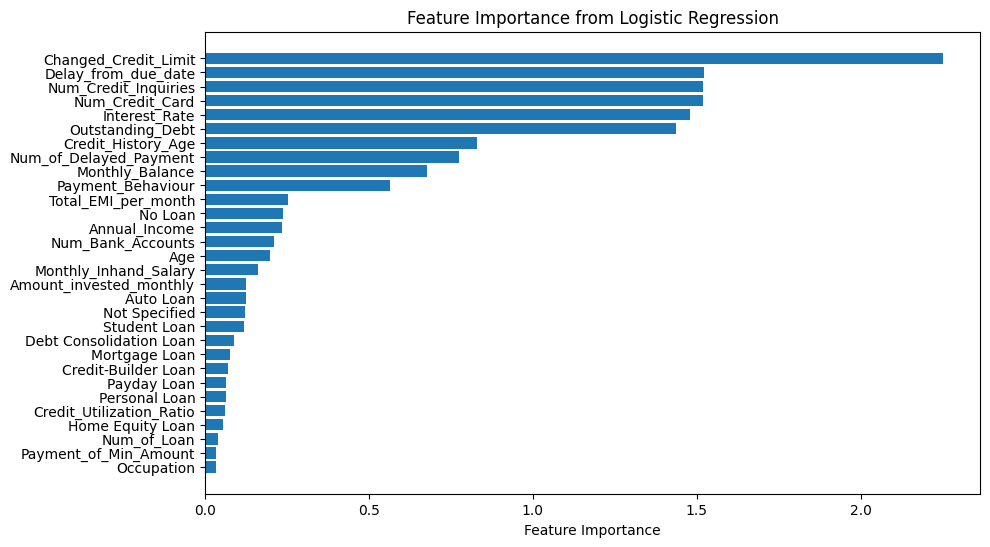

In [ ]:
coefficients = lr_model.coef_[0]
# Create a DataFrame with feature names and their corresponding coefficients
feature_importance_lr = pd.DataFrame({'Feature': Xtrain.columns, 'Coefficient': coefficients})

# Sort the features by the absolute value of the coefficient
feature_importance_lr['Importance'] = feature_importance_lr['Coefficient'].abs()
feature_importance_lr = feature_importance_lr.sort_values(by='Importance', ascending=True)

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_lr['Feature'], feature_importance_lr['Importance'])
plt.xlabel('Feature Importance')
plt.title('Feature Importance from Logistic Regression')
plt.show()

* Random Forest

Sensitivity (Recall): 0.6732
Specificity: 0.8691


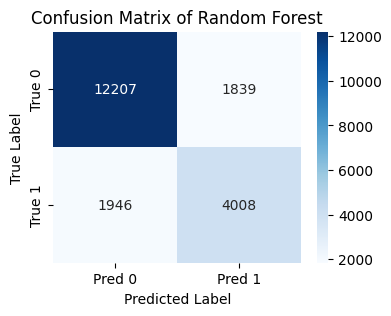

              precision    recall  f1-score   support

           0       0.86      0.87      0.87     14046
           1       0.69      0.67      0.68      5954

    accuracy                           0.81     20000
   macro avg       0.77      0.77      0.77     20000
weighted avg       0.81      0.81      0.81     20000

Balanced Accuracy: 0.7711169729710494


In [ ]:
y_pred_rf = rf_model.predict(Xtest)
sensitivity_specificity(ytest, y_pred_rf, 'Random Forest')
print(classification_report(ytest, y_pred_rf))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_rf)}')

Sensitivity (Recall): 0.9977
Specificity: 0.9411


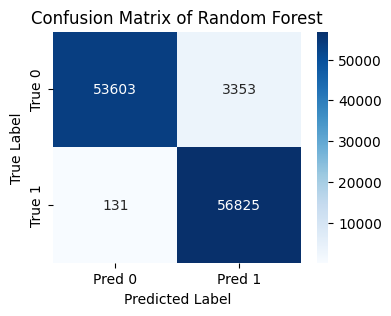

              precision    recall  f1-score   support

           0       1.00      0.94      0.97     56956
           1       0.94      1.00      0.97     56956

    accuracy                           0.97    113912
   macro avg       0.97      0.97      0.97    113912
weighted avg       0.97      0.97      0.97    113912

Balanced Accuracy: 0.9694149870075146


In [ ]:
y_train_pred_rf = rf_model.predict(Xtrain)
sensitivity_specificity(ytrain, y_train_pred_rf, 'Random Forest')
print(classification_report(ytrain, y_train_pred_rf))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytrain, y_train_pred_rf)}')

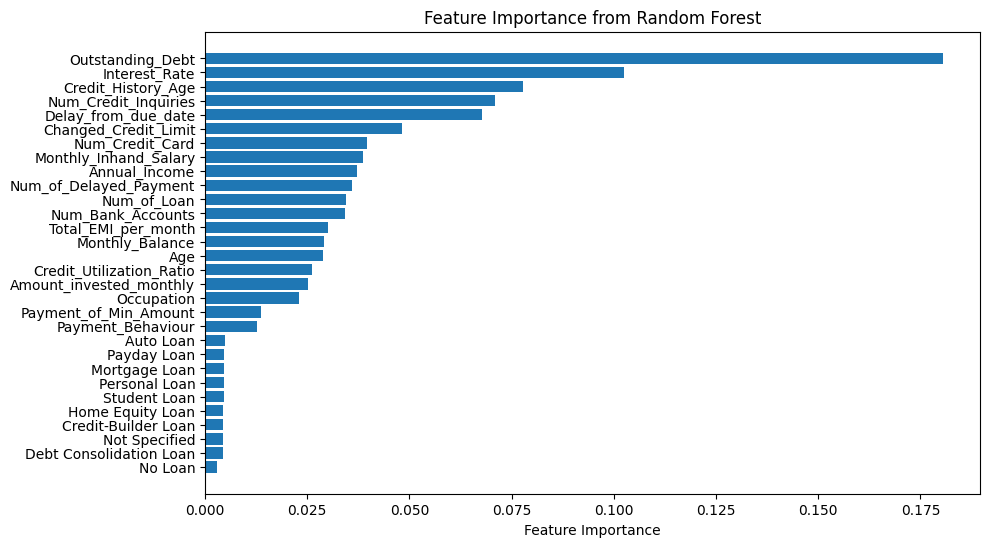

In [ ]:
plot_feature_importance(rf_model, Xtrain.columns, "Feature Importance from Random Forest")

* Decision Tree

Sensitivity (Recall): 0.6431
Specificity: 0.8083


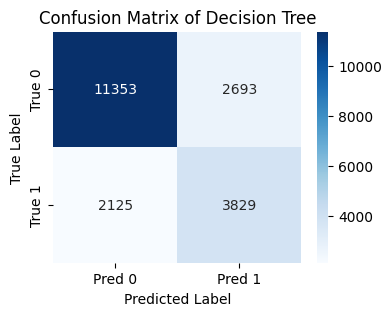

              precision    recall  f1-score   support

           0       0.84      0.81      0.82     14046
           1       0.59      0.64      0.61      5954

    accuracy                           0.76     20000
   macro avg       0.71      0.73      0.72     20000
weighted avg       0.77      0.76      0.76     20000

Balanced Accuracy: 0.7256849477394947


In [ ]:
y_pred_dt = dt_model.predict(Xtest)
sensitivity_specificity(ytest, y_pred_dt, 'Decision Tree')
print(classification_report(ytest, y_pred_dt))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_dt)}')

Sensitivity (Recall): 0.9692
Specificity: 0.9238


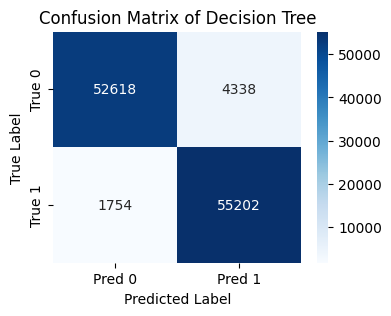

              precision    recall  f1-score   support

           0       0.97      0.92      0.95     56956
           1       0.93      0.97      0.95     56956

    accuracy                           0.95    113912
   macro avg       0.95      0.95      0.95    113912
weighted avg       0.95      0.95      0.95    113912

Balanced Accuracy: 0.9465201207949996


In [ ]:
y_train_pred_dt = dt_model.predict(Xtrain)
sensitivity_specificity(ytrain, y_train_pred_dt, 'Decision Tree')
print(classification_report(ytrain, y_train_pred_dt))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytrain, y_train_pred_dt)}')

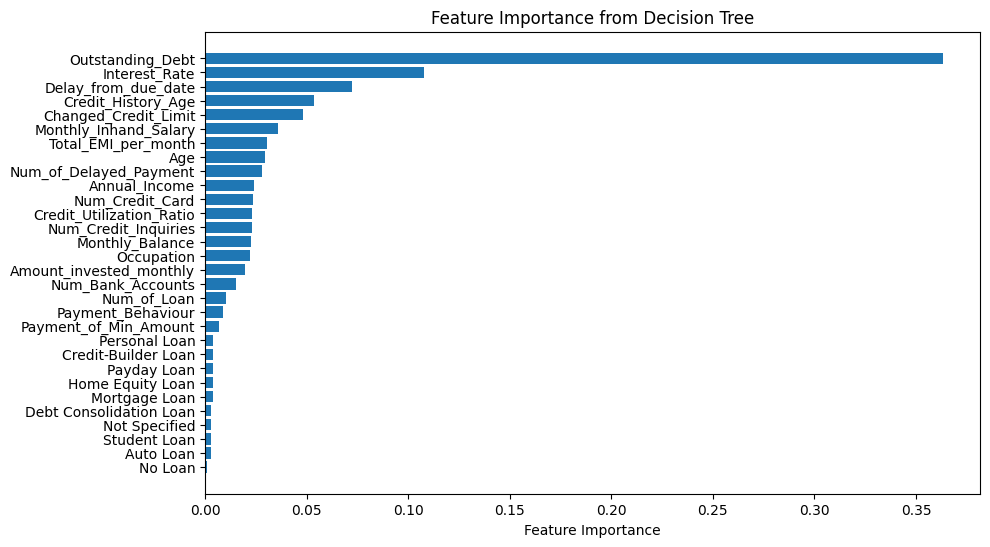

In [ ]:
plot_feature_importance(dt_model, Xtrain.columns, "Feature Importance from Decision Tree")

* XG Boost

Sensitivity (Recall): 0.7650
Specificity: 0.8191


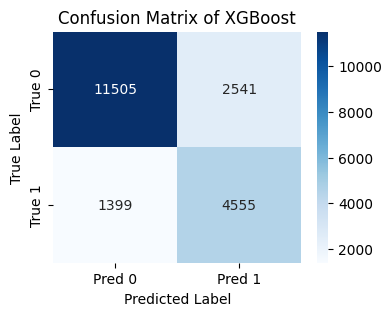

              precision    recall  f1-score   support

           0       0.89      0.82      0.85     14046
           1       0.64      0.77      0.70      5954

    accuracy                           0.80     20000
   macro avg       0.77      0.79      0.78     20000
weighted avg       0.82      0.80      0.81     20000

Balanced Accuracy: 0.7920631577104662


In [ ]:
y_pred_xgb = xgb_model.predict(Xtest)
sensitivity_specificity(ytest, y_pred_xgb, 'XGBoost')
print(classification_report(ytest, y_pred_xgb))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_xgb)}')

Sensitivity (Recall): 0.8323
Specificity: 0.8405


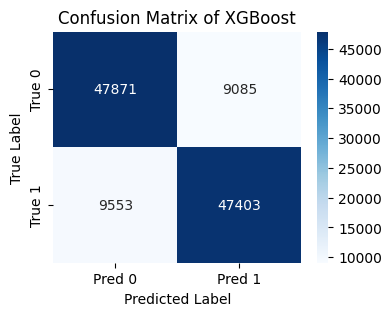

              precision    recall  f1-score   support

           0       0.83      0.84      0.84     56956
           1       0.84      0.83      0.84     56956

    accuracy                           0.84    113912
   macro avg       0.84      0.84      0.84    113912
weighted avg       0.84      0.84      0.84    113912

Balanced Accuracy: 0.8363824706791207


In [ ]:
y_train_pred_xgb = xgb_model.predict(Xtrain)
sensitivity_specificity(ytrain, y_train_pred_xgb, 'XGBoost')
print(classification_report(ytrain, y_train_pred_xgb))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytrain, y_train_pred_xgb)}')

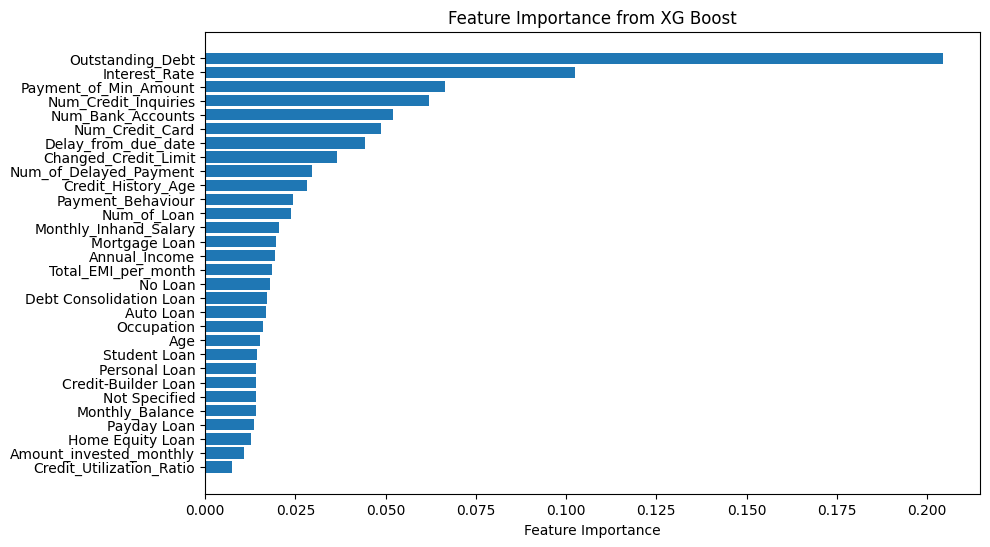

In [ ]:
plot_feature_importance(xgb_model, Xtrain.columns, "Feature Importance from XG Boost")

* Gaussian Naive Bayes

Sensitivity (Recall): 0.7481
Specificity: 0.7382


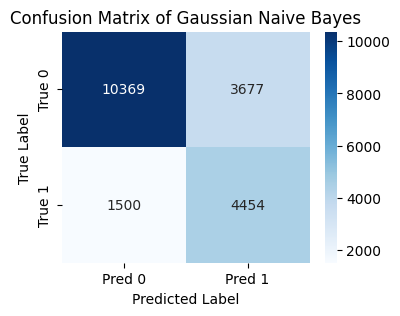

              precision    recall  f1-score   support

           0       0.87      0.74      0.80     14046
           1       0.55      0.75      0.63      5954

    accuracy                           0.74     20000
   macro avg       0.71      0.74      0.72     20000
weighted avg       0.78      0.74      0.75     20000

Balanced Accuracy: 0.743142905710595


In [ ]:
y_pred_nb = nb_model.predict(Xtest)
sensitivity_specificity(ytest, y_pred_nb, 'Gaussian Naive Bayes')
print(classification_report(ytest, y_pred_nb))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_nb)}')

Sensitivity (Recall): 0.7647
Specificity: 0.7400


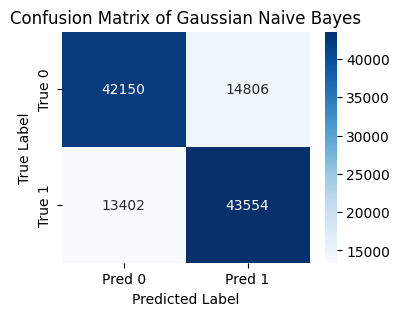

              precision    recall  f1-score   support

           0       0.76      0.74      0.75     56956
           1       0.75      0.76      0.76     56956

    accuracy                           0.75    113912
   macro avg       0.75      0.75      0.75    113912
weighted avg       0.75      0.75      0.75    113912

Balanced Accuracy: 0.752370250719854


In [ ]:
y_train_pred_nb = nb_model.predict(Xtrain)
sensitivity_specificity(ytrain, y_train_pred_nb, 'Gaussian Naive Bayes')
print(classification_report(ytrain, y_train_pred_nb))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytrain, y_train_pred_nb)}')

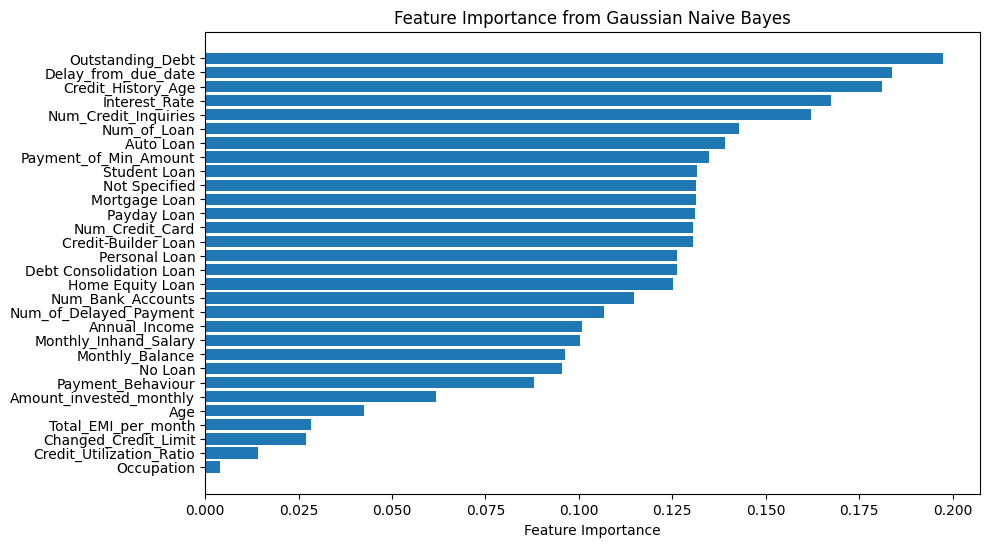

In [ ]:
feature_importances_nb = np.abs(nb_model.theta_[1] - nb_model.theta_[0])
importance_df = pd.DataFrame({
        'Feature': Xtrain.columns,
        'Importance': feature_importances_nb
    }).sort_values(by='Importance', ascending=True)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Feature Importance')
plt.title('Feature Importance from Gaussian Naive Bayes')
plt.show()

* Gini Score

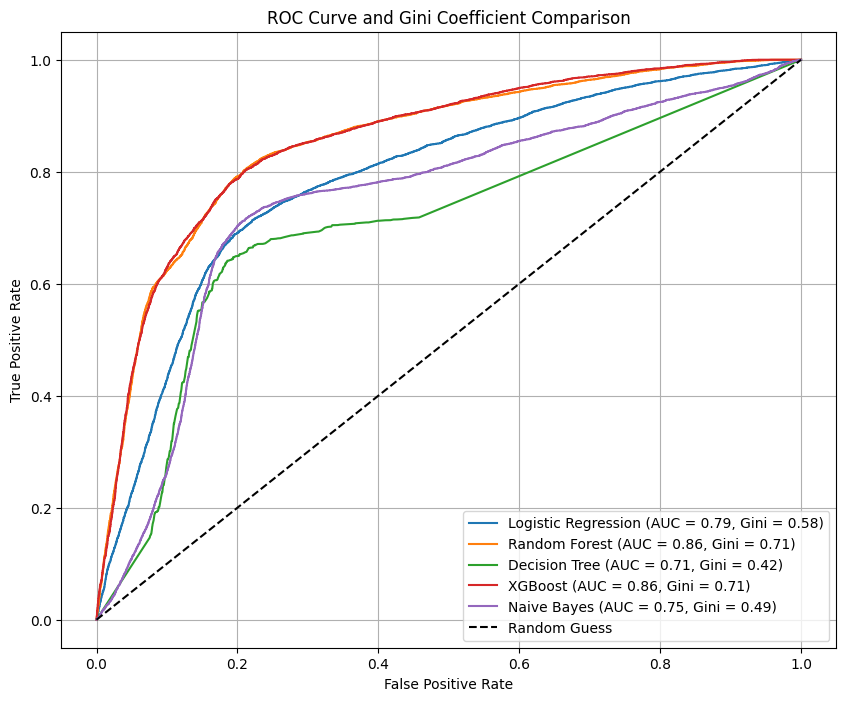

In [ ]:
# y_prob_lr = lr_pipeline.predict_proba(Xtest)[:, 1]
y_prob_lr = lr_model.predict_proba(Xtest)[:, 1]
fpr_lr, tpr_lr, thresholds_lr = roc_curve(ytest, y_prob_lr)
auc_lr = roc_auc_score(ytest, y_prob_lr)
gini_lr = 2 * auc_lr - 1

# y_prob_rf = rf_pipeline.predict_proba(Xtest)[:, 1]
y_prob_rf = rf_model.predict_proba(Xtest)[:, 1]
fpr_rf, tpr_rf, thresholds_rf = roc_curve(ytest, y_prob_rf)
auc_rf = roc_auc_score(ytest, y_prob_rf)
gini_rf = 2 * auc_rf - 1

# y_prob_dt = dt_pipeline.predict_proba(Xtest)[:, 1]
y_prob_dt = dt_model.predict_proba(Xtest)[:, 1]
fpr_dt, tpr_dt, thresholds_dt = roc_curve(ytest, y_prob_dt)
auc_dt = roc_auc_score(ytest, y_prob_dt)
gini_dt = 2 * auc_dt - 1

# y_prob_xgb = xgb_pipeline.predict_proba(Xtest)[:, 1]
y_prob_xgb = xgb_model.predict_proba(Xtest)[:, 1]
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(ytest, y_prob_xgb)
auc_xgb = roc_auc_score(ytest, y_prob_xgb)
gini_xgb = 2 * auc_xgb - 1

# y_prob_nb = nb_pipeline.predict_proba(Xtest)[:, 1]
y_prob_nb = nb_model.predict_proba(Xtest)[:, 1]
fpr_nb, tpr_nb, thresholds_nb = roc_curve(ytest, y_prob_nb)
auc_nb = roc_auc_score(ytest, y_prob_nb)
gini_nb = 2 * auc_nb - 1

# Plot the ROC curve for both models
plt.figure(figsize=(10, 8))
plt.plot(fpr_lr, tpr_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f}, Gini = {gini_lr:.2f})')
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.2f}, Gini = {gini_rf:.2f})')
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {auc_dt:.2f}, Gini = {gini_dt:.2f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f}, Gini = {gini_xgb:.2f})')
plt.plot(fpr_nb, tpr_nb, label=f'Naive Bayes (AUC = {auc_nb:.2f}, Gini = {gini_nb:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve and Gini Coefficient Comparison')
plt.legend()
plt.grid()
plt.show()


b. Error Analysis

To observe the outcome, **error analysis** is conducted. We used **UMAP** to visualize how errors or misclassifications appear, allowing us to better understand the patterns and relationships between the features of incorrectly classified instances. This visualization helps identify potential areas for improvement in the model and guides further refinement.

In [ ]:
umap = UMAP(n_components=2, random_state=42)
Xumap = umap.fit_transform(Xtest)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


* Logistic Regression

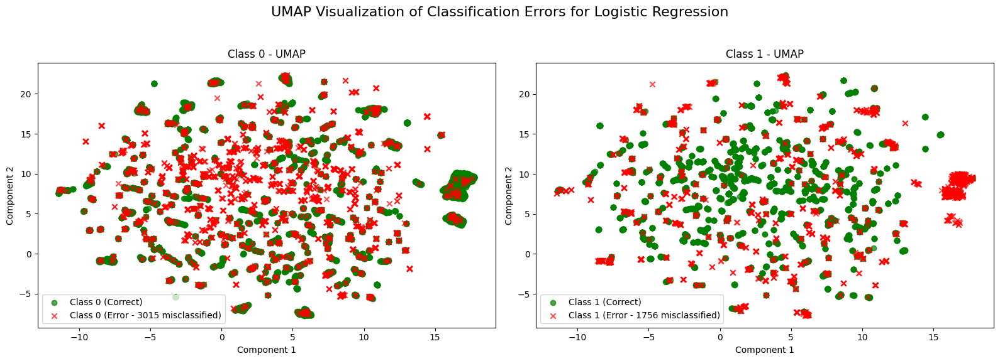

In [ ]:
errors_lr = ytest != y_pred_lr
plot_embeddings(Xumap, "UMAP", errors_lr, "Logistic Regression")

* Random Forest

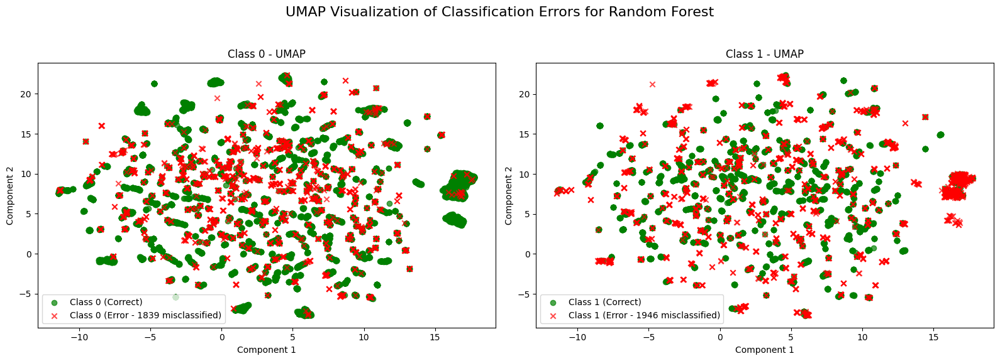

In [ ]:
errors_rf = ytest != y_pred_rf
plot_embeddings(Xumap, "UMAP", errors_rf, "Random Forest")

* Decision Tree

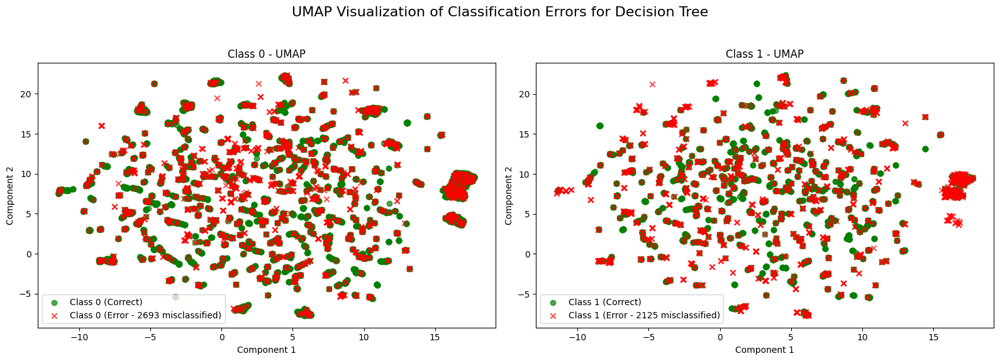

In [ ]:
errors_dt = ytest != y_pred_dt
plot_embeddings(Xumap, "UMAP", errors_dt, "Decision Tree")

* XG Boost

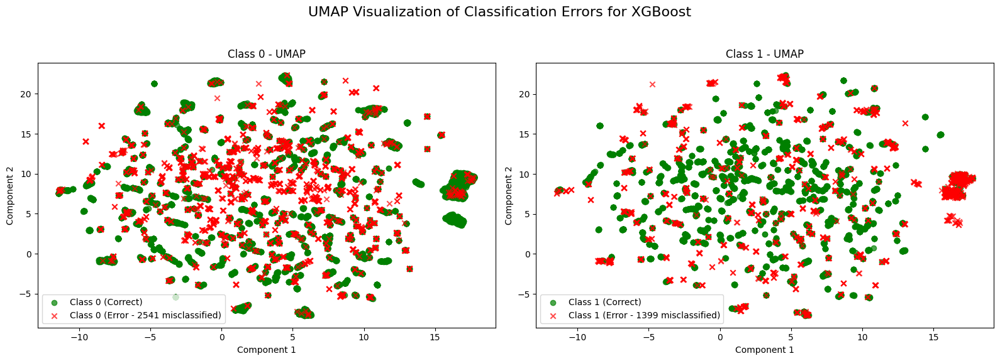

In [ ]:
errors_xgb = ytest != y_pred_xgb
plot_embeddings(Xumap, "UMAP", errors_xgb, "XGBoost")

* Gaussian Naive Bayes

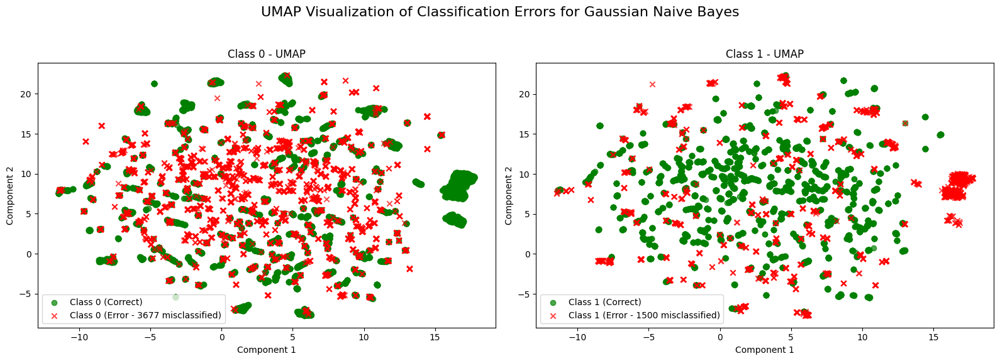

In [ ]:
errors_nb = ytest != y_pred_nb
plot_embeddings(Xumap, "UMAP", errors_nb, "Gaussian Naive Bayes")

c. Uncertainty Cases

In Uncertainty Cases, we considered the probability range within 0.45 and 0.55 to be uncertain, and see how much uncertain cases was misclassified by the models.

In [ ]:
models = ['Logistic Regression', 'Random Forest', 'XG Boost', 'Naive Bayes', 'Decision Tree']
y_probs = [y_prob_lr, y_prob_rf, y_prob_xgb, y_prob_nb, y_prob_dt]
y_preds = [y_pred_lr, y_pred_rf, y_pred_xgb, y_pred_nb, y_pred_dt]

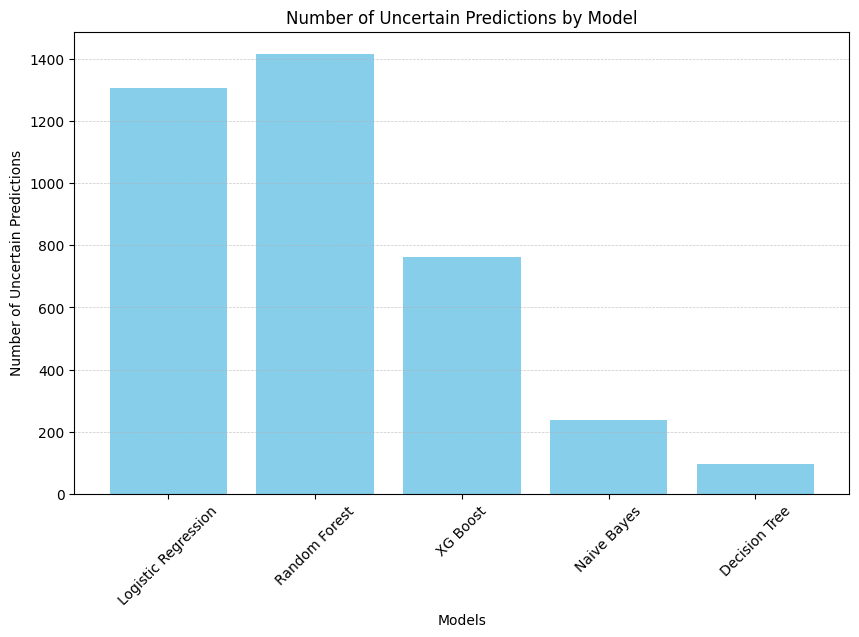

In [ ]:
plot_uncertain_predictions(models, y_probs, (0.45, 0.55))

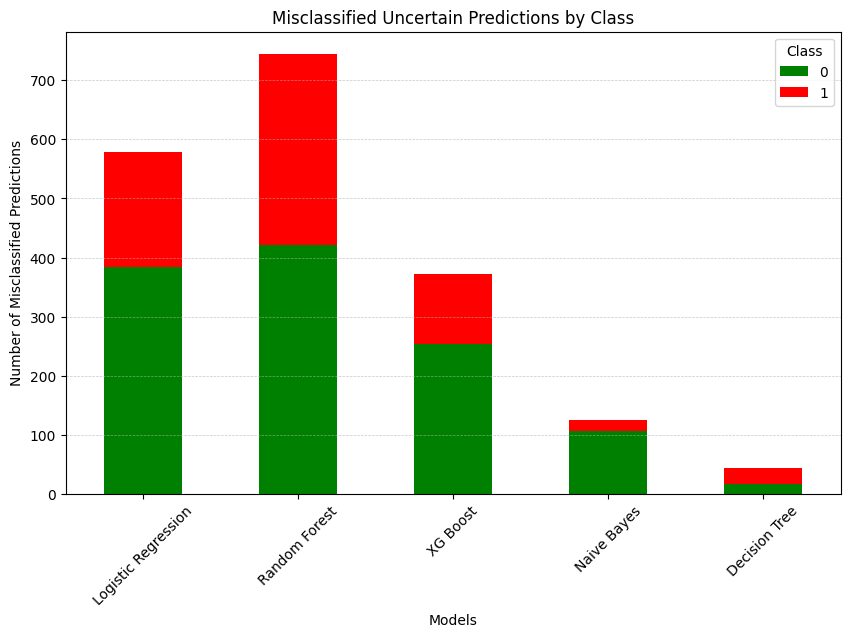

In [ ]:
plot_misclassified_uncertain_by_class(models, y_probs, y_preds, (0.45, 0.55))

From the analysis, interms of accuracy, **XG Boost, Random Forest, and Logistic Regression** are some of the highest. However, in the problem, our main goal is to predict for **Poor Credit Score**, dispite being great accuracy, Random Forst recall for the '1' or 'Poor' class is insignificant, therefore the misclassifacation for class '1' happens alot more than class '0'. So to tackle with it, we have chosen to work with **XG Boost, Logistic Regression, and Gaussian Naive Bayes** models, all of these model have great balanced accuracy and less misclassified cases in class '1'.

# Explain

To further analyze the models, we provide **Local Interpretable Model-Agnostic Explanations (LIME)** and **Shapley values** for each model.

**LIME** is an Explainable AI technique that generates local explanations for individual predictions by approximating the model's behavior with an interpretable surrogate model, such as a simple linear regression. It works by perturbing the input data and observing how the model’s predictions change, allowing us to understand how specific features influence the outcome for a particular instance. LIME is model-agnostic, meaning it can be applied to any machine learning model, regardless of its complexity, making it a versatile tool for interpreting predictions and enhancing transparency.

**Shapley values**, on the other hand, provide a unified measure of feature importance by assigning a value to each feature based on its contribution to the prediction. Derived from cooperative game theory, Shapley values help explain how each feature impacts the model’s output in a fair and consistent way. This method not only gives global feature importance but also allows for precise local explanations, making it particularly useful for understanding complex models and ensuring fairness in predictions.

In [ ]:
import shap
shap.initjs()

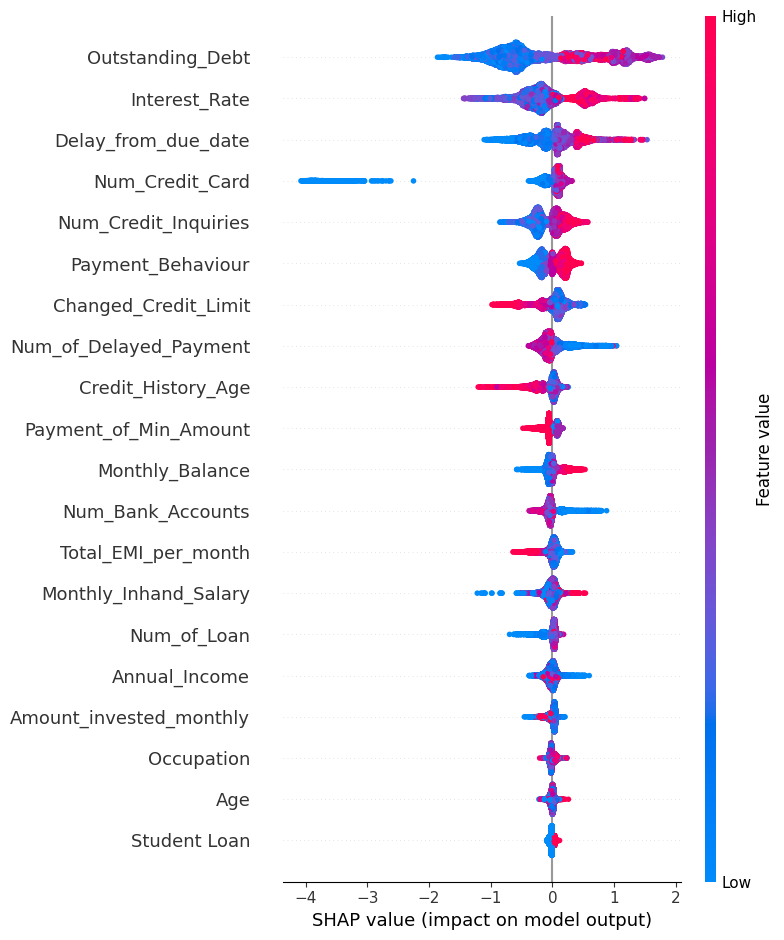

In [ ]:
explainer_xgb = shap.TreeExplainer(xgb_model)
shap_values_xgb = explainer_xgb.shap_values(Xtest)

shap.summary_plot(shap_values_xgb, Xtest)

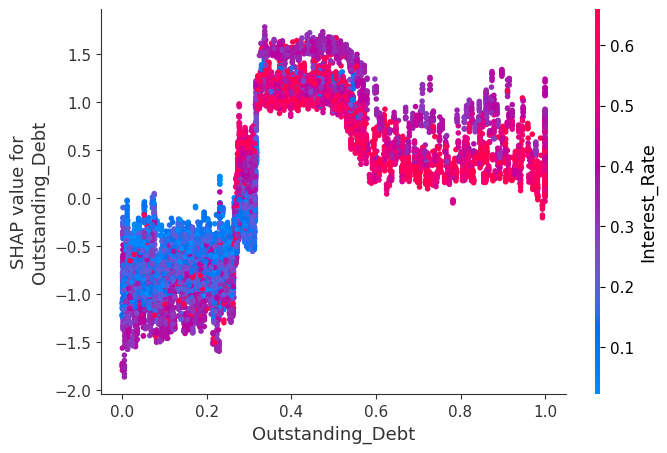

In [ ]:
shap.dependence_plot('Outstanding_Debt', shap_values_xgb, Xtest)

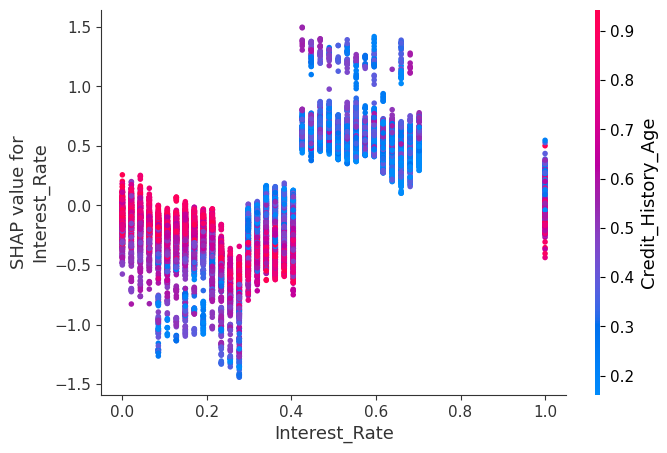

In [ ]:
shap.dependence_plot('Interest_Rate', shap_values_xgb, Xtest)

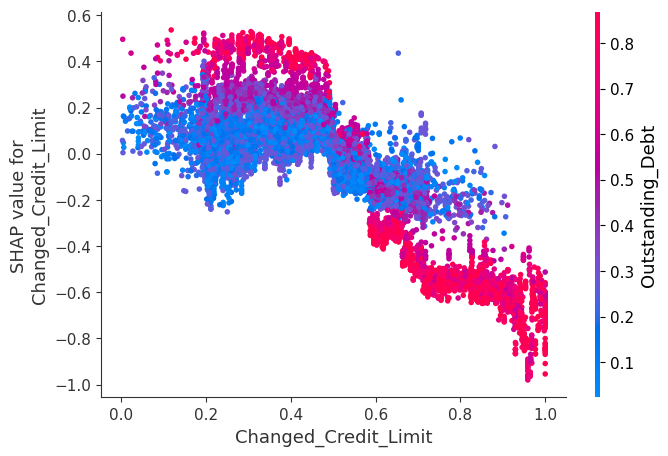

In [ ]:
shap.dependence_plot('Changed_Credit_Limit', shap_values_xgb, Xtest)

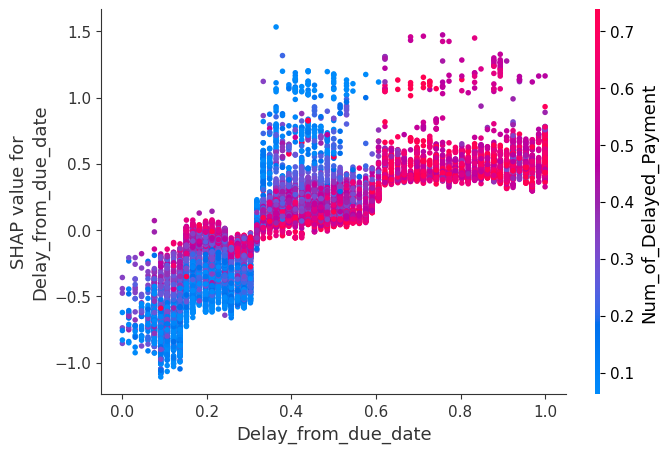

In [ ]:
shap.dependence_plot('Delay_from_due_date', shap_values_xgb, Xtest)

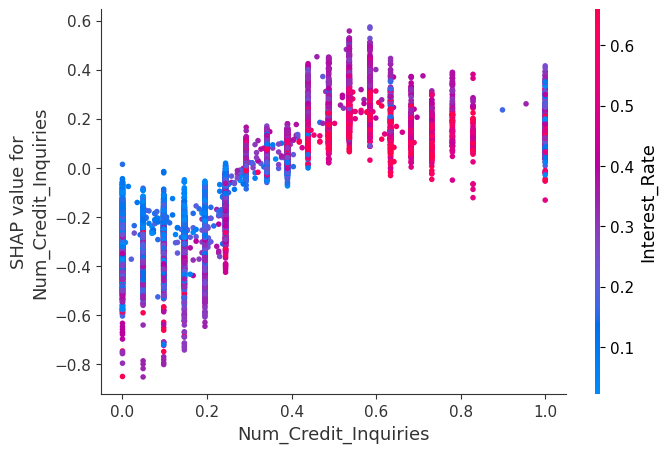

In [ ]:
shap.dependence_plot('Num_Credit_Inquiries', shap_values_xgb, Xtest)

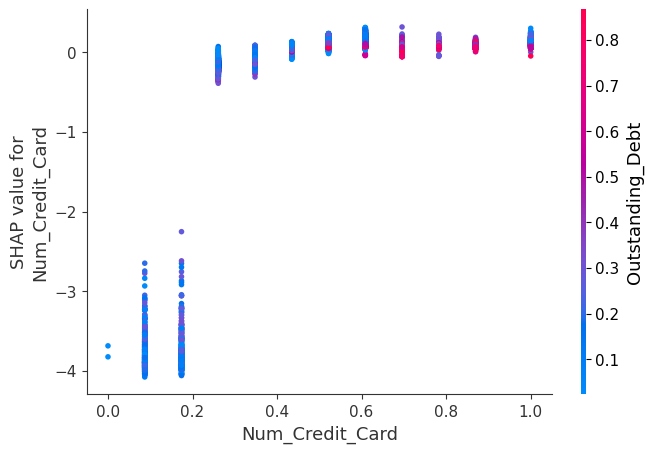

In [ ]:
shap.dependence_plot('Num_Credit_Card', shap_values_xgb, Xtest)

In [ ]:
shap_values_xgb.shape

(20000, 30)

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=19c8d77a6de3246cab4c2513fe8388fa8427f9e937c5c8eaf25eee92d3f88f21
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular

In [ ]:
# Select a sample to explain
sample_idx = 100
sample = Xtest.iloc[sample_idx]

In [ ]:
sample

,100
Age,0.676692
Occupation,0.428571
Annual_Income,0.256186
Monthly_Inhand_Salary,0.298035
Num_Bank_Accounts,0.571429
Num_Credit_Card,0.434783
Interest_Rate,0.638298
Num_of_Loan,0.250000
Delay_from_due_date,1.000000
Num_of_Delayed_Payment,0.553846


In [ ]:
# Create a LIME explainer
explainer_nb = lime.lime_tabular.LimeTabularExplainer(
    training_data=Xtrain.values,
    feature_names=Xtrain.columns,
    class_names=nb_model.classes_,
    mode='classification')

# Generate the explanation
exp_nb = explainer_nb.explain_instance(sample.values, nb_model.predict_proba, labels = [0])


# Show the explanation in notebook
exp_nb.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [ ]:
explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=Xtrain.values,
    feature_names=Xtrain.columns,
    class_names=lr_model.classes_,
    mode='classification')
exp_lr = explainer_lr.explain_instance(sample.values, lr_model.predict_proba, labels=[0])
exp_lr.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=Xtrain.values,
    feature_names=Xtrain.columns,
    class_names=xgb_model.classes_,
    mode='classification')

exp_xgb = explainer_xgb.explain_instance(sample.values, xgb_model.predict_proba, labels=[0])
exp_xgb.show_in_notebook()

# Soft Voting

To further increase the performance, we use soft voting to classify based on the predictions from the top 3 models. Soft voting is an ensemble technique where the predicted probabilities of each class from all selected models are averaged, and the class with the highest averaged probability is chosen as the final prediction. This approach leverages the strengths of each model, providing a more robust and accurate classification by combining their insights.

In [ ]:
voting_clf = VotingClassifier(
    estimators=[
        ('lr', lr_model),
        ('nb', nb_model),
        ('xgb', xgb_model)
    ],
    voting='soft',
    weights=[1, 1, 4]
)

voting_clf.fit(Xtrain, ytrain)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

In [ ]:
y_pred_vote = voting_clf.predict(Xtest)
sensitivity_specificity(ytest, y_pred_vote, 'Soft Voting')
print(classification_report(ytest, y_pred_vote))
print(f'Balanced Accuracy: {balanced_accuracy_score(ytest, y_pred_vote)}')

In [ ]:
y_prob_vote = voting_clf.predict_proba(Xtest)[:, 1]
fpr_vote, tpr_vote, thresholds_vote = roc_curve(ytest, y_prob_vote)
auc_vote = roc_auc_score(ytest, y_prob_vote)
gini_vote = 2 * auc_vote - 1

plt.figure(figsize=(10, 8))
plt.plot(fpr_lr, tpr_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f}, Gini = {gini_lr:.2f})')
plt.plot(fpr_nb, tpr_nb, label=f'Naive Bayes (AUC = {auc_nb:.2f}, Gini = {gini_nb:.2f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f}, Gini = {gini_xgb:.2f})')
plt.plot(fpr_vote, tpr_vote, label=f'Soft Voting (AUC = {auc_vote:.2f}, Gini = {gini_vote:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve and Gini Coefficient Comparison')
plt.legend()
plt.grid()
plt.show()

In [ ]:
errors_soft = ytest != y_pred_vote

In [ ]:
plot_embeddings(Xumap, "UMAP", errors_soft, "Soft Voting")

In [ ]:
models = ['Logistic Regression', 'XG Boost', 'Naive Bayes','Soft Voting']
y_probs = [y_prob_lr, y_prob_xgb, y_prob_nb, y_prob_vote]
y_preds = [y_pred_lr, y_pred_xgb, y_pred_nb, y_pred_vote]

In [ ]:
plot_uncertain_predictions(models, y_probs, (0.45, 0.55))

In [ ]:
plot_misclassified_uncertain_by_class(models, y_probs, y_preds, (0.45, 0.55))

# Save Model

In [ ]:
with open('/content/drive/MyDrive/NCKH 2024/Modeling - NCKH-NEU/soft_voting_clf.pkl', 'wb') as file:
    pkl.dump(voting_clf, file)

In [ ]:
with open(save_path + 'xgb_clf.pkl', 'wb') as file:
  pkl.dump(xgb_model, file)

In [ ]:
whos

In [ ]:
# save the classification results of all models
df = pd.DataFrame()
df['ytest'] = ytest
df['y_prob_dt'] = y_prob_dt
df['y_pred_dt'] = y_pred_dt
df['y_prob_lr'] = y_prob_lr
df['y_pred_lr'] = y_pred_lr
df['y_prob_nb'] = y_prob_nb
df['y_pred_nb'] = y_pred_nb
df['y_prob_rf'] = y_prob_rf
df['y_pred_rf'] = y_pred_rf
df['y_prob_xgb'] = y_prob_xgb
df['y_pred_xgb'] = y_pred_xgb
df['y_prob_vote'] = y_prob_vote
df['y_pred_vote'] = y_pred_vote

df.to_csv(save_path + 'rst_test.csv')


In [ ]:
Data = {'Xtrain': Xtrain,
        'Xtest': Xtest,
        'ytrain': ytrain,
        'ytest': ytest}
np.save(save_path + 'Data_train_test.npy', Data)